<b>Vũ Minh Như - 21110360 - DIP Lab04

In [33]:
import numpy as np 
import pandas as pd
import cv2 
from matplotlib import pyplot as plt 
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec
from pylab import imread
from skimage.color import rgb2gray

In [21]:
def ShowImage(ImageList, nRows = 1, nCols = 2, WidthSpace = 0.00, HeightSpace = 0.00):
    from matplotlib import pyplot as plt 
    import matplotlib.gridspec as gridspec
    
    gs = gridspec.GridSpec(nRows, nCols)     
    gs.update(wspace=WidthSpace, hspace=HeightSpace) # set the spacing between axes.
    plt.figure(figsize=(20,10))
    for i in range(len(ImageList)):
        ax1 = plt.subplot(gs[i])
        ax1.set_xticklabels([])
        ax1.set_yticklabels([])
        ax1.set_aspect('equal')

        plt.subplot(nRows, nCols,i+1)

        image = ImageList[i].copy()
        if (len(image.shape) < 3):
            plt.imshow(image, plt.cm.gray)
        else:
            plt.imshow(image)
        plt.title("Image " + str(i))
        plt.axis('off')

    plt.show()

### Câu 1:

<b>Kiếm một ảnh trên internet và thực hiện các bước sau:</b> </br>
* Chuyển đổi thành ảnh xám
* Biến đổi DFT và hiển thị ảnh ở miền tần số
* Thực hiện tạo ảnh mask để bỏ miền tần số cao và hiển thị ảnh texture
* Thực hiện tạo ảnh mask để bỏ miền tần số thấp và hiển thị ảnh edge
* Thực hiện tạo ảnh mask như sau và thực hiện thay đổi miền tần số sau đó xuất kết quả

##### Chuyển đổi thành ảnh xám:

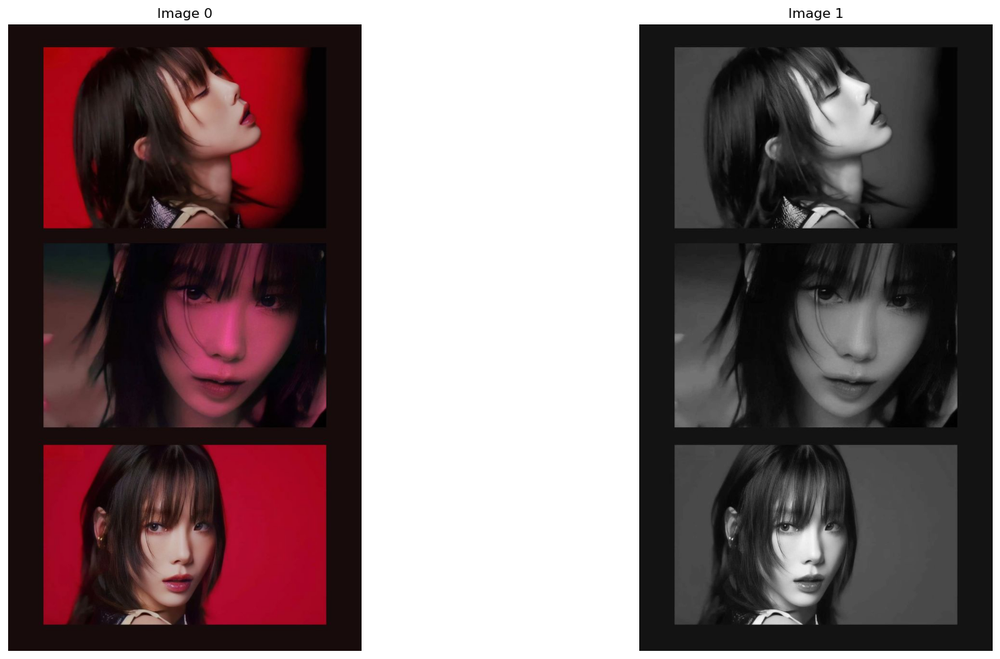

In [22]:
image_color = imread("taeyeon_photoshoot.jpg")
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

ShowImage([image_color, image_gray], 1, 2)

##### Biến đổi DFT và hiển thị ảnh ở miền tần số

In [5]:
def Image3Dto2D(image):
    if(len(image.shape) >= 3):
        image_2D = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        image_2D = image.copy()
    return image_2D

In [6]:
def DFT_Transformation(image):
    img = Image3Dto2D(image) 

    img_float32 = np.float32(img)
    dft = cv2.dft(img_float32, flags = cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)
    magnitude_spectrum = 20*np.log(cv2.magnitude(dft_shift[:,:,0],dft_shift[:,:,1]))

    return magnitude_spectrum, dft_shift

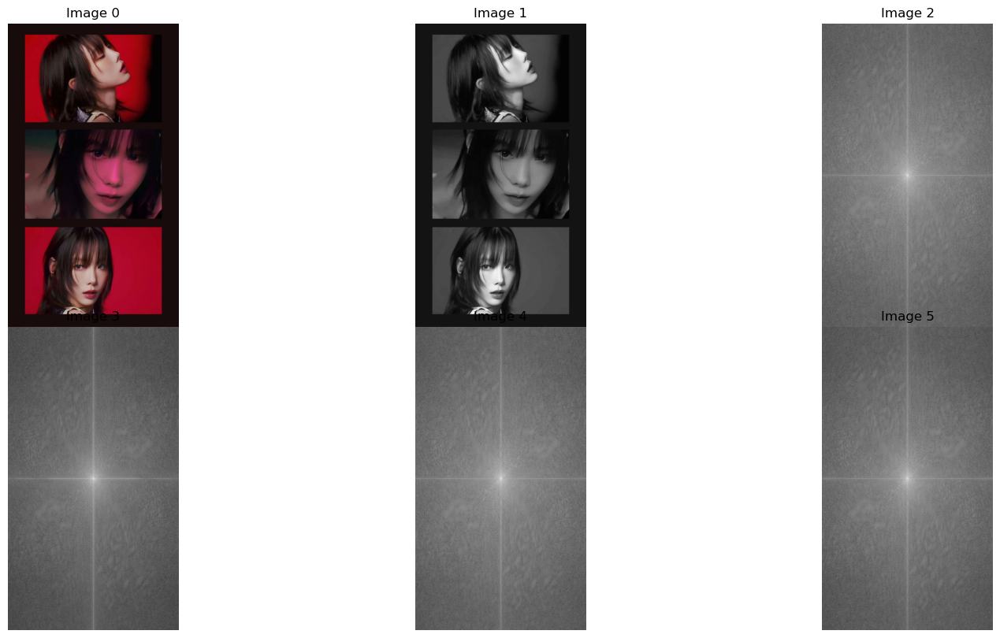

In [23]:
image_dft_frequency, dft_shift = DFT_Transformation(image_gray)
image_dft_frequency1, dft_shift1 = DFT_Transformation(image_color[:,:,0])
image_dft_frequency2, dft_shift2 = DFT_Transformation(image_color[:,:,1])
image_dft_frequency3, dft_shift3 = DFT_Transformation(image_color[:,:,2])
ShowImage([image_color, image_gray,  image_dft_frequency, image_dft_frequency1, image_dft_frequency2, image_dft_frequency3], 2, 3)

##### Thực hiện tạo ảnh mask để bỏ miền tần số cao và hiển thị ảnh texture

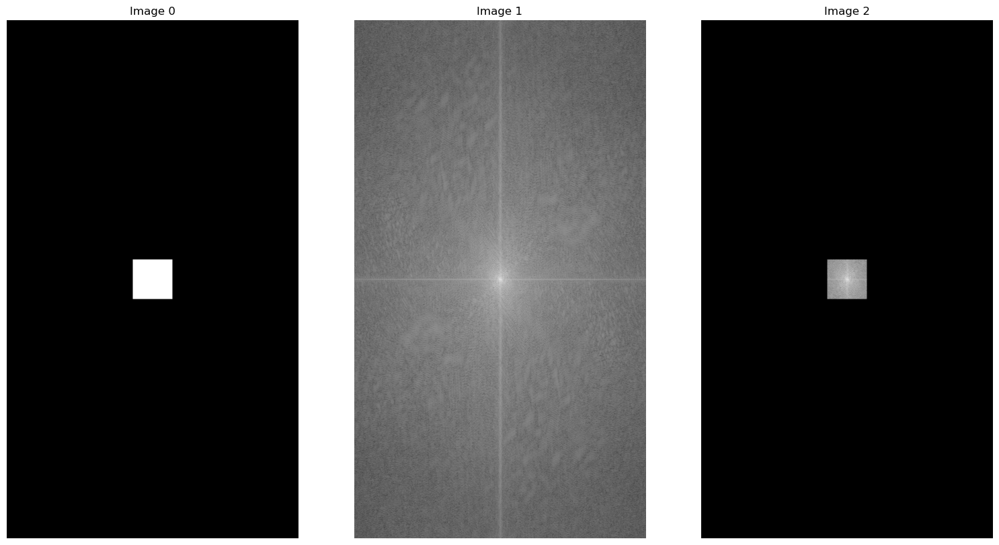

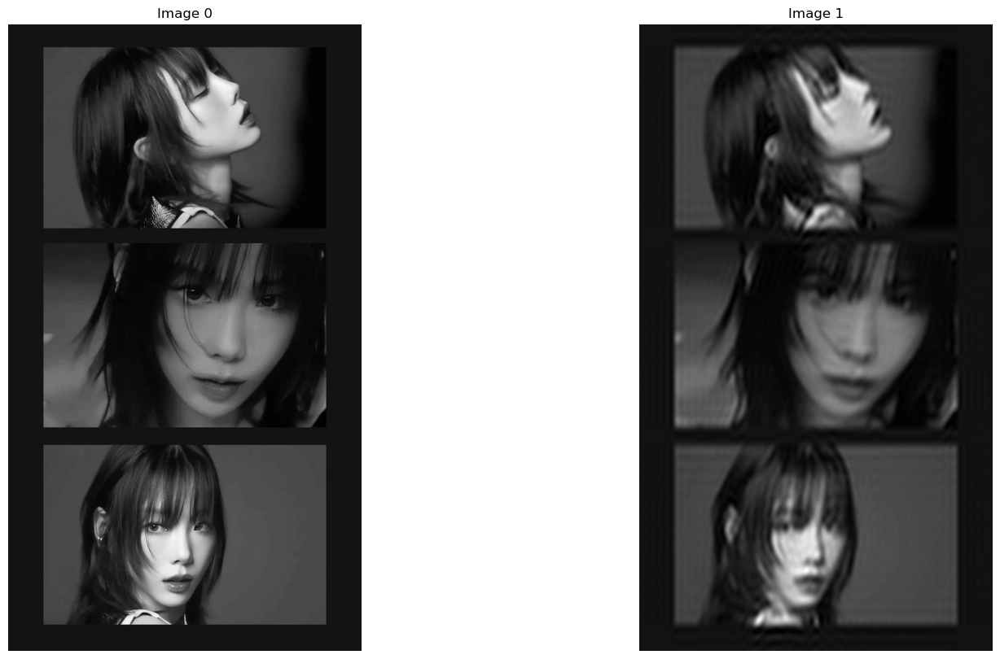

In [24]:
rows, cols = image_gray.shape
crow, ccol = (int)(rows/2) , (int)(cols/2)

# create a mask first, center square is 1, remaining all zeros
mask = np.zeros((rows, cols, 2), np.uint8)
size = 50
mask[crow-size:crow+size, ccol-size:ccol+size] = 1
image_dft_frequency_crop = image_dft_frequency* mask[:,:,0]

# apply mask and inverse DFT
fshift = dft_shift*mask
f_ishift = np.fft.ifftshift(fshift)
img_inverse = cv2.idft(f_ishift)
image_inverse = cv2.magnitude(img_inverse[:,:,0],img_inverse[:,:,1])

ShowImage([mask[:,:,0], image_dft_frequency, image_dft_frequency_crop], 1, 3)
ShowImage([image_gray, image_inverse], 1, 2)

##### Thực hiện tạo ảnh mask để bỏ miền tần số thấp và hiển thị ảnh edge

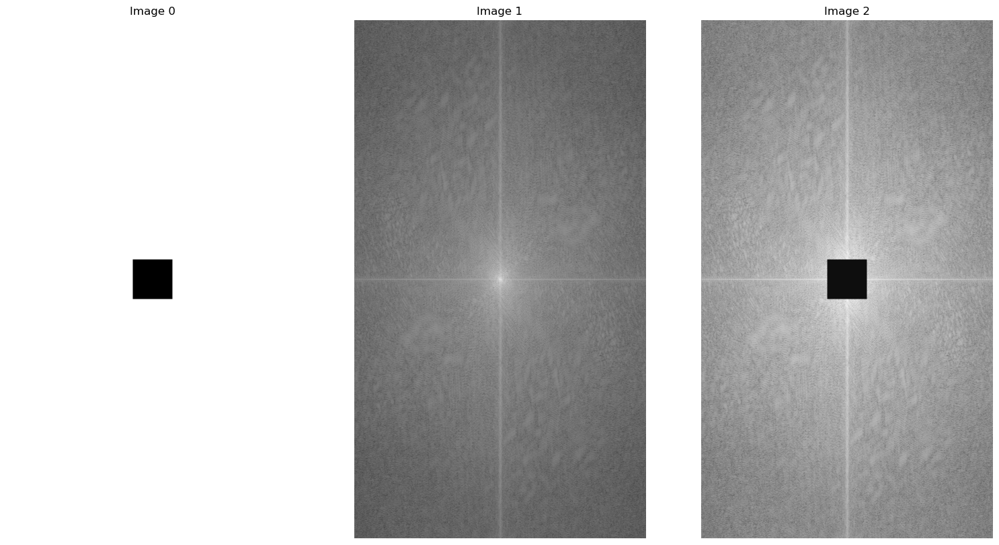

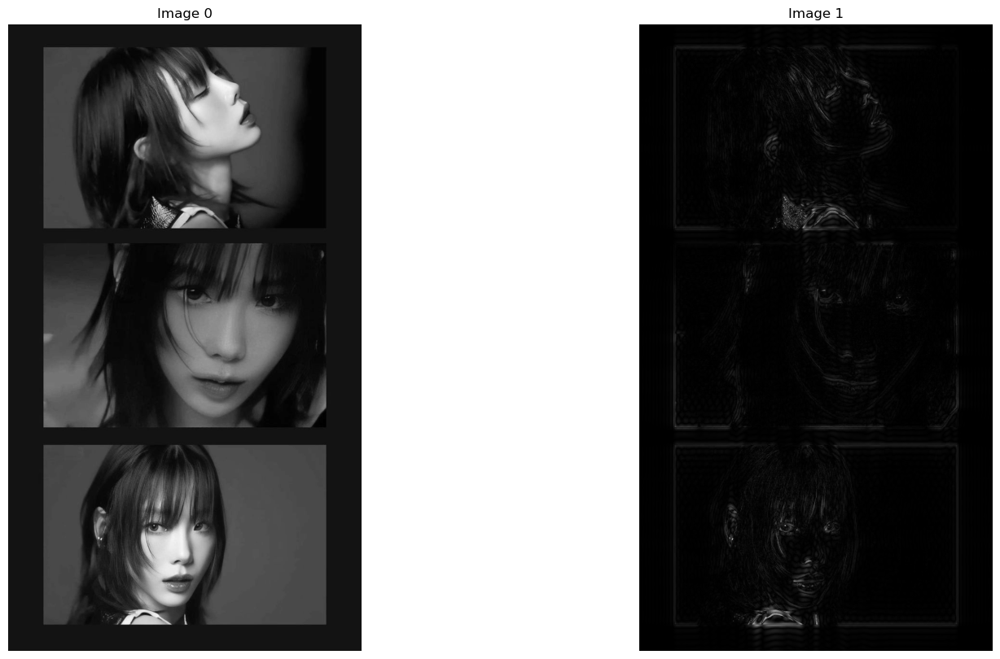

In [25]:
rows, cols = image_gray.shape
crow,ccol = (int)(rows/2) , (int)(cols/2)

# create a mask first, center square is 1, remaining all zeros
mask = np.zeros((rows, cols, 2), np.uint8)
size = 50
mask[crow-size:crow+size, ccol-size:ccol+size] = 1
mask = 1 - mask
image_dft_frequency_crop = image_dft_frequency* mask[:,:,0]

# apply mask and inverse DFT
fshift = dft_shift*mask
f_ishift = np.fft.ifftshift(fshift)
img_inverse = cv2.idft(f_ishift)
image_inverse = cv2.magnitude(img_inverse[:,:,0],img_inverse[:,:,1])

ShowImage([mask[:,:,0], image_dft_frequency, image_dft_frequency_crop], 1, 3)
ShowImage([image_gray, image_inverse], 1, 2)

##### Thực hiện tạo ảnh mask như sau và thực hiện thay đổi miền tần số sau đó xuất kết quả

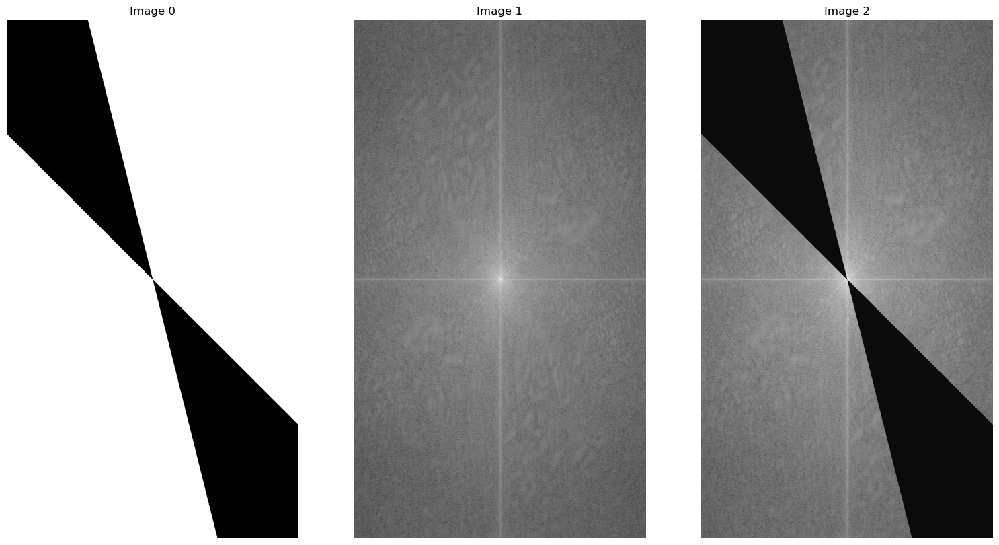

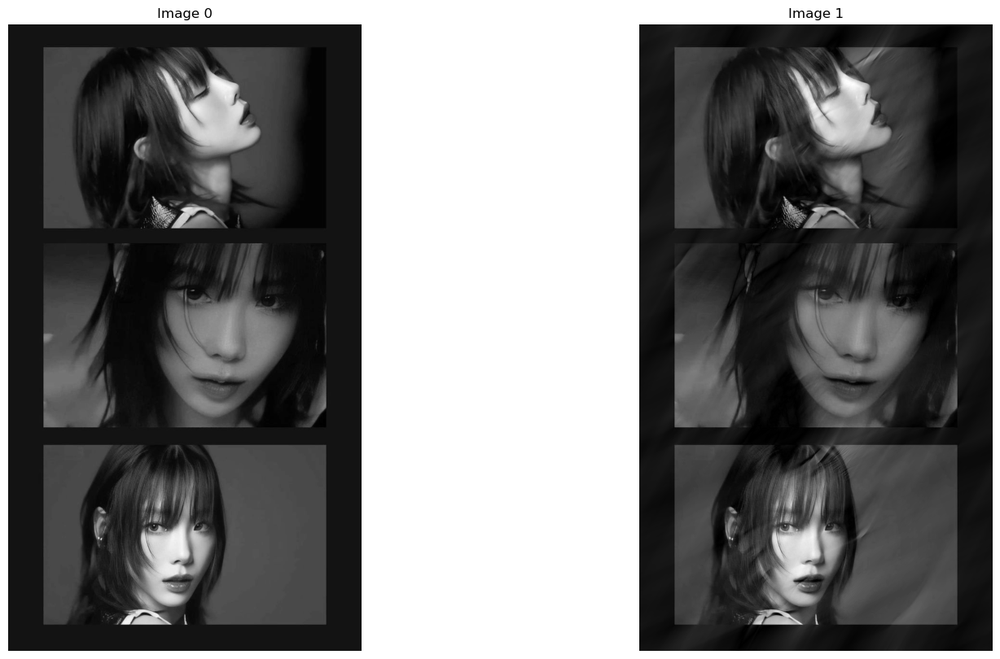

In [26]:
rows,cols = image_gray.shape
crow,ccol = (int)(rows/2) , (int)(cols/2)

# create two lines
def lineA(x,crow,ccol): return (x-crow) + ccol
def lineB(x,crow,ccol): return 0.25*(x-crow) + ccol

# create a mask first, center square is 1, remaining all zeros
mask = np.zeros((rows, cols, 2), np.uint8)

for y in range(cols):
    for x in range(rows):
        if (y-lineA(x,crow,ccol))*(y-lineB(x,crow,ccol)) <= 0:
            mask[x,y,0] = 1

mask = 1 - mask
image_dft_frequency_crop = image_dft_frequency*mask[:,:,0]

# apply mask and inverse DFT
fshift = dft_shift*mask
f_ishift = np.fft.ifftshift(fshift)
img_inverse = cv2.idft(f_ishift)
image_inverse = cv2.magnitude(img_inverse[:,:,0],img_inverse[:,:,1])

ShowImage([mask[:,:,0], image_dft_frequency, image_dft_frequency_crop], 1, 3)
ShowImage([image_gray, image_inverse], 1, 2)

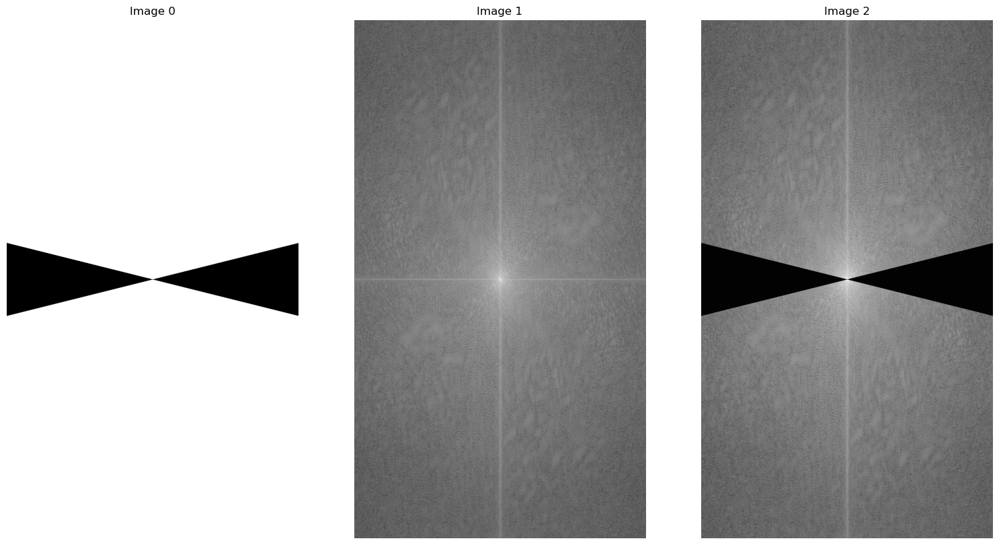

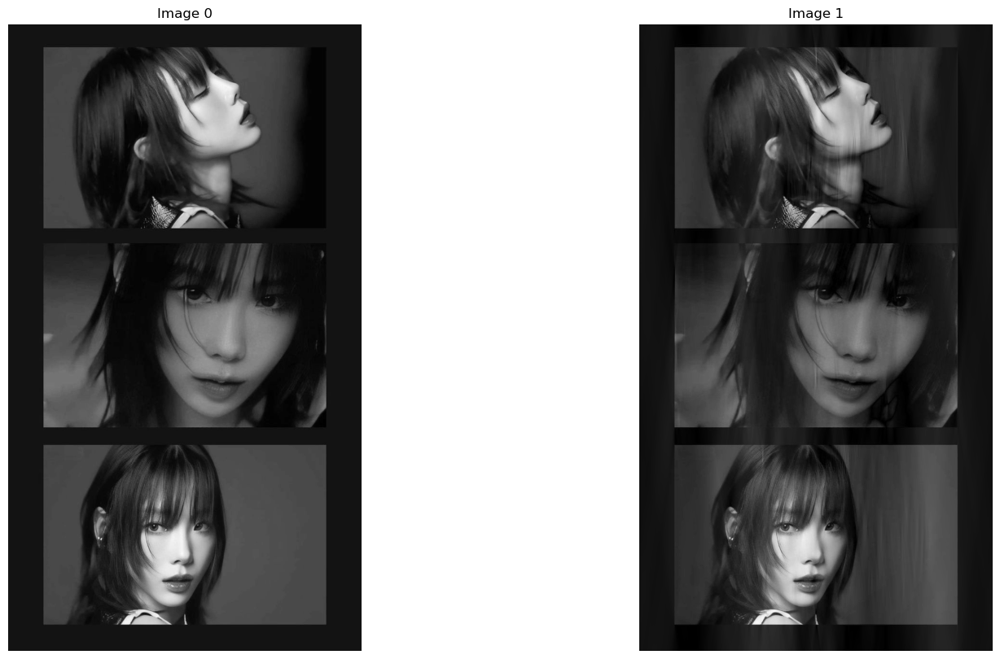

In [27]:
rows,cols = image_gray.shape
crow,ccol = (int)(rows/2) , (int)(cols/2)

# create two lines
def lineA(x,crow,ccol): return 4*(x-crow) + ccol
def lineB(x,crow,ccol): return -4*(x-crow) + ccol

# create a mask first, center square is 1, remaining all zeros
mask = np.zeros((rows, cols, 2), np.uint8)

for y in range(cols):
    for x in range(rows):
        if (y-lineA(x,crow,ccol))*(y-lineB(x,crow,ccol)) >= 0:
            mask[x,y,0] = 1

mask = 1 - mask
image_dft_frequency_crop = image_dft_frequency*mask[:,:,0]

# apply mask and inverse DFT
fshift = dft_shift*mask
f_ishift = np.fft.ifftshift(fshift)
img_inverse = cv2.idft(f_ishift)
image_inverse = cv2.magnitude(img_inverse[:,:,0],img_inverse[:,:,1])

ShowImage([mask[:,:,0], image_dft_frequency, image_dft_frequency_crop], 1, 3)
ShowImage([image_gray, image_inverse], 1, 2)

### Câu 2

<b>Kiếm một ảnh trên internet và thực hiện các bước sau:</b> </br>
* Chuyển đổi thành ảnh xám
* Biến đổi DCT và hiển thị ảnh DCT
* Đặt ngưỡng giữ lại khoảng 5% hệ số DCT và hiển thị ảnh nén kết quả

##### Chuyển đổi thành ảnh xám

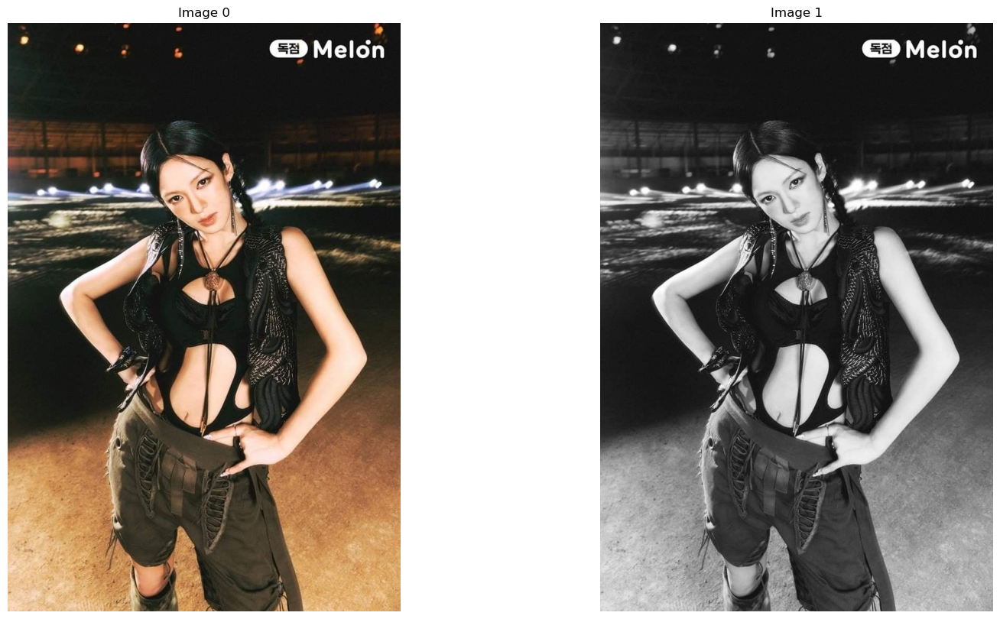

In [28]:
image_2 = imread("Hyoyeon.jpg")
image_2_gray = cv2.cvtColor(image_2, cv2.COLOR_RGB2GRAY)

ShowImage([image_2, image_2_gray], 1, 2)

##### Biến đổi DCT và hiển thị ảnh DCT

In [45]:
def dct2(a):
  import scipy
  return scipy.fftpack.dct(scipy.fftpack.dct(a,axis=0,norm='ortho'), axis =1,
                           norm='ortho')
def idct2(a):
  import scipy
  return scipy.fftpack.idct(scipy.fftpack.idct(a, axis = 0, norm = 'ortho'),axis =1, norm = 'ortho')


In [30]:
im = image_2_gray
imsize = im.shape
dct = np.zeros(imsize)

# Do 8x8 DCT on image (in-place)
for i in np.r_[:imsize[0]:8]:
    for j in np.r_[:imsize[1]:8]:
        dct[i:(i+8),j:(j+8)] = dct2(im[i:(i+8),j:(j+8)])

Text(0.5, 1.0, '8x8 DCTs of the image')

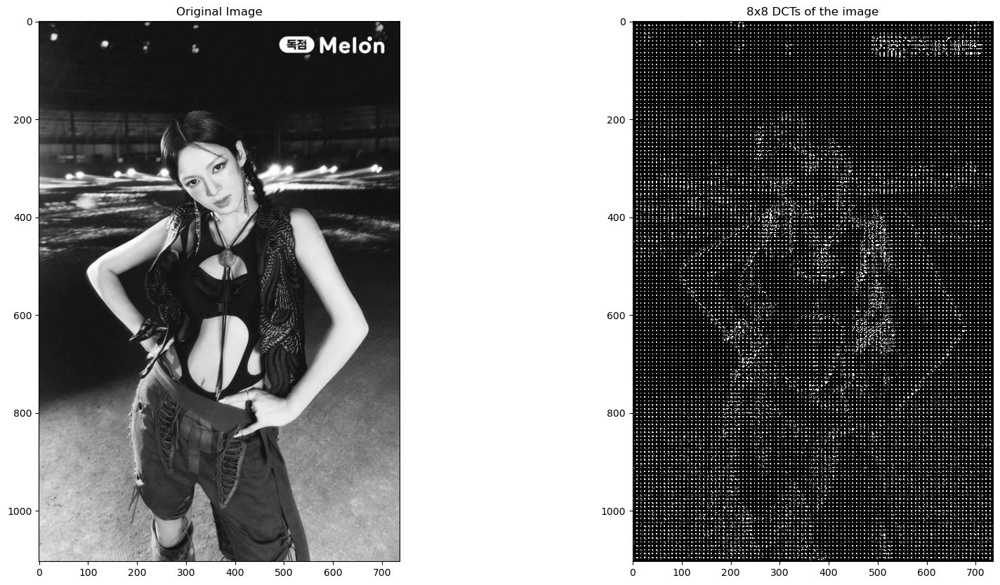

In [31]:
# Display entire DCT
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(image_2_gray, cmap = 'gray')
plt.title( "Original Image")
plt.subplot(1,2,2)
plt.imshow(dct,cmap='gray',vmax = np.max(dct)*0.01,vmin = 0)
plt.title( "8x8 DCTs of the image")

##### Phần BT thêm: Hiển thị block ảnh của DCT

Text(0.5, 1.0, 'An 8x8 DCT block')

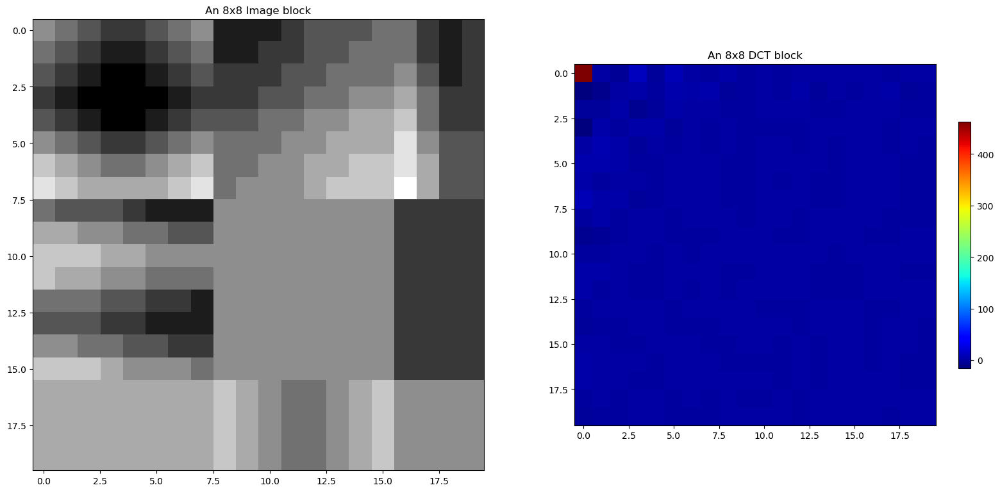

In [34]:
pos = 128
SampleBlock = im[pos:pos+20,pos:pos+20]
SampleDCT = dct2(SampleBlock)

plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(SampleBlock,cmap='gray')
plt.title( "An 8x8 Image block")

# Display the dct of that block
plt.subplot(1,2,2)
plt.imshow(SampleDCT,cmap=cm.jet,interpolation='nearest')
plt.colorbar(shrink=0.5)
plt.title( "An 8x8 DCT block")

##### Đặt ngưỡng giữ lại khoảng 5% hệ số DCT và hiển thị ảnh nén kết quả

In [35]:
# Threshold
thresh = 0.0089
dct_thresh = dct * (abs(dct) > (thresh*np.max(dct)))

percent_nonzeros = np.sum( dct_thresh != 0.0 ) / (imsize[0]*imsize[1]*1.0)
print("Keeping only %f%% of the DCT coefficients" % (percent_nonzeros*100.0))

Keeping only 7.179427% of the DCT coefficients


Comparison between original and DCT compressed images


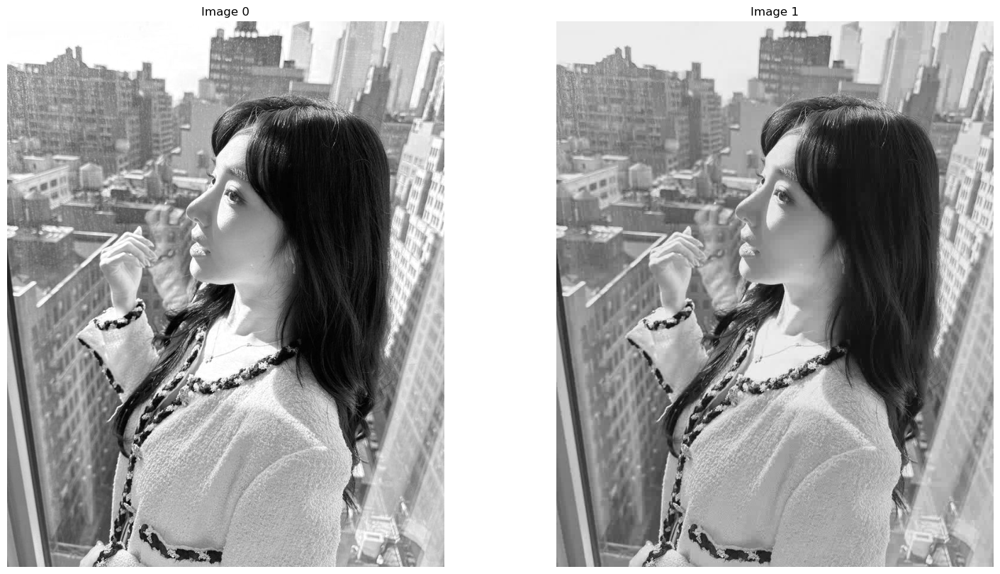

In [46]:
im_dct = np.zeros(imsize)
for i in np.r_[:imsize[0]:8]:
    for j in np.r_[:imsize[1]:8]:
        im_dct[i:(i+8),j:(j+8)] = idct2(dct_thresh[i:(i+8),j:(j+8)])
        
print("Comparison between original and DCT compressed images" )
ShowImage([im, im_dct])

### Câu 3

Kiếm một ảnh màu trên internet và thực hiển nén các ảnh này dùng DFT và DCT bằng cách giữ lại 5% hệ số. Sau đó khôi phục lại ảnh màu và lưu xuống thư mục cũng như xuất dung lượng ảnh xem giảm được bao nhiêu dung lượng (Gợi ý dùng không gian HSV nén V nhưng vẫn giữ được màu, thử nén H và S xem sao)

Keeping only 10.609506% of the DCT coefficients
Keeping only 8.943440% of the DFT coefficients
Comparison between original, DCT compressed and DFT compressed images


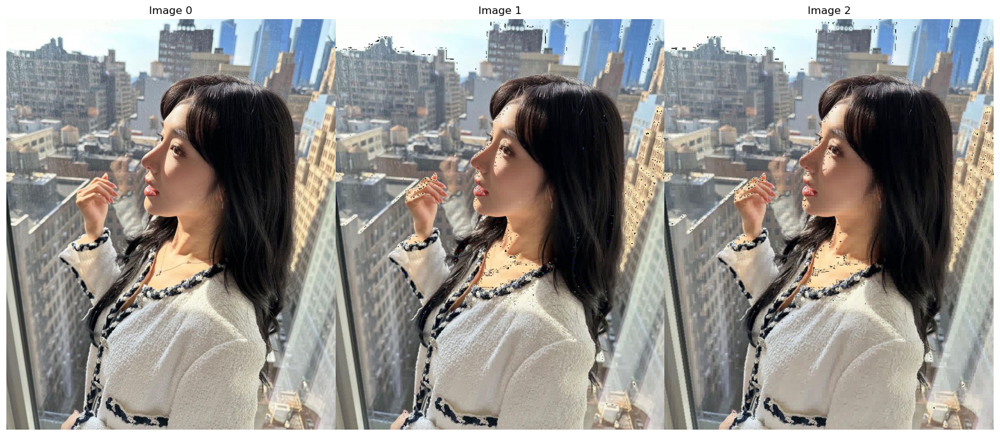

In [48]:
# Read Image
nameImgO = "tiffany.jpg"
image_3 = imread(nameImgO)
# Convert Image into HSV
image_hsv = cv2.cvtColor(image_3, cv2.COLOR_RGB2HSV)
restored_image_hsv_dct = np.copy(image_hsv)
restored_image_hsv_dft = np.copy(image_hsv)

im = image_hsv[:,:,2]
imsize = im.shape
dct = np.zeros(imsize)

# Do 8x8 DCT on image (in-place)
for i in np.r_[:imsize[0]:8]:
    for j in np.r_[:imsize[1]:8]:
        dct[i:(i+8),j:(j+8)] = dct2(im[i:(i+8),j:(j+8)])

# Threshold dct
thresh_dct = 0.0108
dct_thresh = dct * (abs(dct) > (thresh_dct*np.max(dct)))

dft = np.zeros(imsize,dtype='complex');
im_dft = np.zeros(imsize,dtype='complex');

# 8x8 DFT
for i in np.r_[:imsize[0]:8]:
    for j in np.r_[:imsize[1]:8]:
        dft[i:(i+8),j:(j+8)] = np.fft.fft2(im[i:(i+8),j:(j+8)])
        
# Threshold dft
thresh_dft = 0.014
dft_thresh = dft * (abs(dft) > (thresh_dft*np.max(abs(dft))))
        
im_dct = np.zeros(imsize)
for i in np.r_[:imsize[0]:8]:
    for j in np.r_[:imsize[1]:8]:
        im_dct[i:(i+8),j:(j+8)] = idct2(dct_thresh[i:(i+8),j:(j+8)])

# restored hsv dct
restored_image_hsv_dct[:, :, 2] = im_dct
restored_image_rgb_dct = cv2.cvtColor(restored_image_hsv_dct, cv2.COLOR_HSV2RGB)

# 8x8 iDFT
for i in np.r_[:imsize[0]:8]:
    for j in np.r_[:imsize[1]:8]:
        im_dft[i:(i+8),j:(j+8)] = np.fft.ifft2(dft_thresh[i:(i+8),j:(j+8)])

# restored hsv dft
restored_image_hsv_dft[:, :, 2] = abs(im_dft)
restored_image_rgb_dft = cv2.cvtColor(restored_image_hsv_dft, cv2.COLOR_HSV2RGB)

percent_nonzeros = np.sum(dct_thresh != 0.0 ) / (imsize[0]*imsize[1]*1.0)
percent_nonzeros_dft = np.sum(dft_thresh != 0.0 ) / (imsize[0]*imsize[1]*1.0)

print("Keeping only %f%% of the DCT coefficients" % (percent_nonzeros*100.0))
print("Keeping only %f%% of the DFT coefficients" % (percent_nonzeros_dft*100.0))
print("Comparison between original, DCT compressed and DFT compressed images")
ShowImage([image_3, restored_image_rgb_dct, restored_image_rgb_dft], 1, 3)

In [49]:
# Create input folder if not exist
import os
output_dir = './output'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

In [50]:
nameImage = "restored_image_rgb_dct.jpg"
nameImage2 = "restored_image_rgb_dft.jpg"
output_path = os.path.join(output_dir,nameImage)
output_path_2 = os.path.join(output_dir,nameImage2)
cv2.imwrite(output_path, restored_image_rgb_dct)
cv2.imwrite(output_path_2, restored_image_rgb_dft)

True

In [51]:
# check size image
file_size_img = os.path.getsize("./{}".format(nameImgO))
file_size_dct = os.path.getsize("./output/{}".format(nameImage))
file_size_dft = os.path.getsize("./output/{}".format(nameImage2))
print("Số bytes được giảm của ảnh DCT: {} bytes".format(file_size_img - file_size_dct))
print("Số bytes được giảm của ảnh DFT: {} bytes".format(file_size_img - file_size_dft))
compression_ratio = (1 - file_size_dct / file_size_img) * 100
print(f"Phần trăm dung lượng được giảm của ảnh DCT so với ảnh gốc: {compression_ratio:.2f}%")
compression_ratio_2 = (1 - file_size_dft / file_size_img) * 100
print(f"Phần trăm dung lượng được giảm của ảnh DFT so với ảnh gốc: {compression_ratio:.2f}%")

Số bytes được giảm của ảnh DCT: -70450 bytes
Số bytes được giảm của ảnh DFT: -57598 bytes
Phần trăm dung lượng được giảm của ảnh DCT so với ảnh gốc: -52.50%
Phần trăm dung lượng được giảm của ảnh DFT so với ảnh gốc: -52.50%
